In [309]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline
import numpy as np


# 1.We review the information. Preparing data for processing format

In [310]:
# Загрузка данных / chunksize=None
df = pd.read_csv('train.csv')

In [311]:
df.head()

,ID,CustomerID,Month,Name,Age,SSN,Occupation,AnnualIncome,MonthlyInhandSalary,NumBankAccounts,...,CreditMix,OutstandingDebt,CreditUtilizationRatio,PaymentofMinAmount,TotalEMIpermonth,Amountinvestedmonthly,PaymentBehaviour,MonthlyBalance,CreditScore,CreditHistoryYears
0,0x1602,CUS0xd40,January,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3,...,NaN,809.98,26.822620,No,49.574949,80.415295,HighspentSmallvaluepayments,312.494089,Good,22.0
1,0x1603,CUS0xd40,February,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,No,49.574949,118.280222,LowspentLargevaluepayments,284.629163,Good,NaN
2,0x1604,CUS0xd40,March,Aaron Maashoh,NaN,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,No,49.574949,81.699521,LowspentMediumvaluepayments,331.209863,Good,22.0
3,0x1605,CUS0xd40,April,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,No,49.574949,199.458074,LowspentSmallvaluepayments,223.451310,Good,22.0
4,0x1606,CUS0xd40,May,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,No,49.574949,41.420153,HighspentMediumvaluepayments,341.489231,Good,22.0


In [312]:
df.shape

(100000, 28)

In [313]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   ID                      100000 non-null  object 
 1   CustomerID              100000 non-null  object 
 2   Month                   100000 non-null  object 
 3   Name                    90015 non-null   object 
 4   Age                     99114 non-null   float64
 5   SSN                     94428 non-null   object 
 6   Occupation              92938 non-null   object 
 7   AnnualIncome            100000 non-null  float64
 8   MonthlyInhandSalary     84998 non-null   float64
 9   NumBankAccounts         100000 non-null  int64  
 10  NumCreditCard           100000 non-null  int64  
 11  InterestRate            100000 non-null  int64  
 12  NumofLoan               99965 non-null   float64
 13  TypeofLoan              88592 non-null   object 
 14  Delayfromduedate     

# AGE INVESTIGATION

In [314]:
df['Age'].value_counts(ascending=True)
pd.set_option("display.max_rows", None)

In [315]:
df.loc[(df.Age >= 90 ), 'Age'] = 0
#я обнаружила, что много странного возраста ,неверной информации.
#print(countsAge)
#print('mean:', df['Age'].mean())

In [316]:
df['Age']

0        23.0
1        23.0
2         NaN
3        23.0
4        23.0
5        23.0
6        23.0
7        23.0
8        28.0
9        28.0
10       28.0
11       28.0
12       28.0
13       28.0
14       28.0
15       28.0
16       34.0
17       34.0
18       34.0
19       34.0
20       34.0
21       34.0
22       34.0
23       34.0
24       54.0
25       54.0
26       55.0
27       55.0
28       55.0
29       55.0
30       55.0
31       55.0
32       21.0
33       21.0
34       21.0
35       21.0
36       21.0
37       21.0
38       21.0
39       21.0
40       31.0
41       31.0
42       31.0
43       31.0
44       31.0
45       31.0
46       31.0
47       31.0
48       33.0
49       34.0
50       34.0
51       34.0
52       34.0
53       34.0
54       34.0
55       34.0
56        0.0
57       30.0
58       30.0
59       30.0
60       30.0
61       30.0
62       30.0
63       30.0
64       23.0
65       23.0
66       23.0
67       23.0
68       23.0
69       24.0
70       24.0
71    

In [317]:
df['Age'].isna().sum()


886

In [318]:
#countsAge =  df['Age']
df['Age'].replace(to_replace = 0, value = df['Age'].mean(), inplace=True)

In [319]:
df['Age'].fillna(value=df['Age'].mean(), inplace=True)

In [320]:
df['Age']

0        23.000000
1        23.000000
2        33.307829
3        23.000000
4        23.000000
5        23.000000
6        23.000000
7        23.000000
8        28.000000
9        28.000000
10       28.000000
11       28.000000
12       28.000000
13       28.000000
14       28.000000
15       28.000000
16       34.000000
17       34.000000
18       34.000000
19       34.000000
20       34.000000
21       34.000000
22       34.000000
23       34.000000
24       54.000000
25       54.000000
26       55.000000
27       55.000000
28       55.000000
29       55.000000
30       55.000000
31       55.000000
32       21.000000
33       21.000000
34       21.000000
35       21.000000
36       21.000000
37       21.000000
38       21.000000
39       21.000000
40       31.000000
41       31.000000
42       31.000000
43       31.000000
44       31.000000
45       31.000000
46       31.000000
47       31.000000
48       33.000000
49       34.000000
50       34.000000
51       34.000000
52       34.

In [321]:
#df['CreditScore'].value_counts()

# OCCUPATION

In [322]:
df['Occupation'].value_counts()

Lawyer          6575
Architect       6355
Engineer        6350
Scientist       6299
Mechanic        6291
Accountant      6271
Developer       6235
MediaManager    6232
Teacher         6215
Entrepreneur    6174
Doctor          6087
Journalist      6085
Manager         5973
Musician        5911
Writer          5885
Name: Occupation, dtype: int64

In [323]:
df['Occupation'].isna().sum()


7062

In [324]:
valueOccupation='NoOccupation'

In [325]:
df['Occupation'].fillna(value=valueOccupation, inplace=True)


# MonthlyInhandSalary

In [326]:
df['MonthlyInhandSalary'].value_counts()

6769.130000     15
6358.956667     15
2295.058333     15
6082.187500     15
3080.555000     14
4387.272500     13
5766.491667     13
6639.560000     13
536.431250      12
1315.560833     11
2557.861667      9
1476.062917      8
2610.171667      8
9641.480000      8
11624.846670     8
1393.486667      8
1801.474167      8
7554.577500      8
1365.173333      8
1474.625417      8
4354.813333      8
8002.350000      8
1739.662500      8
11162.153330     8
2533.775833      8
7842.322500      8
2188.398333      8
1108.902500      8
1359.206250      8
1507.335833      8
5028.165000      8
6596.466667      8
1375.585000      8
3459.660000      8
5910.960000      8
3359.415833      8
1095.917500      8
1932.282500      8
1943.840833      8
1082.503750      8
2905.198333      8
824.414583       8
2217.161667      8
6130.986667      8
3506.253333      8
1938.303333      8
817.099583       8
1198.614583      8
1796.880000      8
1505.761667      8
5109.440000      8
4356.750000      8
1022.133333 

In [327]:
df['MonthlyInhandSalary'].isna().sum()

15002

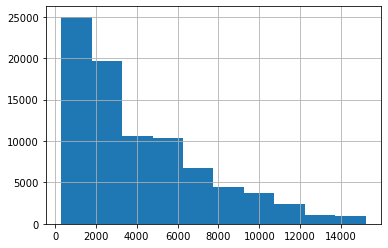

In [328]:
df['MonthlyInhandSalary'].hist();

In [329]:
df['MonthlyInhandSalary'].fillna(value=df['MonthlyInhandSalary'].mean(), inplace=True)

# NumofLoan 

In [330]:
df['NumofLoan'].value_counts()

 3.0       15104
 2.0       15032
 4.0       14743
 0.0       10930
 1.0       10606
 6.0        7803
 7.0        7344
 5.0        7197
-100.0      3841
 9.0        3702
 8.0        3191
 1150.0        4
 1228.0        3
 1480.0        3
 288.0         3
 773.0         3
 430.0         3
 227.0         2
 1131.0        2
 192.0         2
 284.0         2
 898.0         2
 1354.0        2
 404.0         2
 23.0          2
 1241.0        2
 527.0         2
 1259.0        2
 143.0         2
 290.0         2
 1181.0        2
 229.0         2
 911.0         2
 696.0         2
 1209.0        2
 359.0         2
 275.0         2
 1353.0        2
 95.0          2
 1463.0        2
 855.0         2
 1320.0        2
 172.0         2
 141.0         2
 697.0         2
 1384.0        2
 733.0         2
 1127.0        2
 1412.0        2
 251.0         2
 1129.0        2
 50.0          2
 875.0         2
 217.0         2
 1365.0        2
 58.0          2
 955.0         2
 661.0         2
 330.0        

In [331]:
#df.loc[(df.NumofLoan >= 20 ), 'NumofLoan'] = 0
df.loc[(df.NumofLoan < 0 ), 'NumofLoan'] = 0

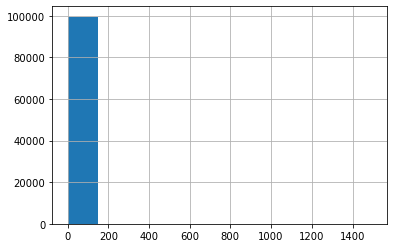

In [332]:
df['NumofLoan'].hist();

In [333]:
df['NumofLoan'].isna().sum()

35

In [334]:
df['NumofLoan'].fillna(value=df['NumofLoan'].mean(), inplace=True)

# NumofDelayedPayment

In [335]:
df['NumofDelayedPayment'].value_counts()

 19.0      5481
 17.0      5412
 16.0      5312
 10.0      5309
 15.0      5237
 18.0      5216
 20.0      5089
 12.0      5059
 9.0       4981
 8.0       4873
 11.0      4810
 14.0      4193
 13.0      4036
 21.0      2553
 7.0       2385
 22.0      2339
 6.0       2321
 5.0       2091
 23.0      2028
 3.0       1931
 4.0       1838
 2.0       1810
 24.0      1701
 25.0      1665
 1.0       1636
 0.0       1609
 26.0       322
-1.0        316
 27.0       250
-2.0        234
 28.0       131
-3.0         94
 3484.0       4
 1946.0       3
 4211.0       3
 1204.0       2
 2801.0       2
 1370.0       2
 3355.0       2
 4164.0       2
 2438.0       2
 674.0        2
 2569.0       2
 1473.0       2
 398.0        2
 3191.0       2
 2697.0       2
 2323.0       2
 192.0        2
 3251.0       2
 1014.0       2
 3050.0       2
 1849.0       2
 2142.0       2
 1180.0       2
 2793.0       2
 1150.0       2
 2621.0       2
 1392.0       2
 1087.0       2
 2278.0       2
 662.0        2
 4231.0 

In [336]:
df.loc[(df.NumofDelayedPayment >= 45 ), 'NumofDelayedPayment'] = 0
df.loc[(df.NumofDelayedPayment < 0 ), 'NumofDelayedPayment'] = 0

In [337]:
df['NumofDelayedPayment'].mean()

13.220499365577755

In [338]:
df['NumofDelayedPayment'].fillna(value=df['NumofDelayedPayment'].mean(), inplace=True)

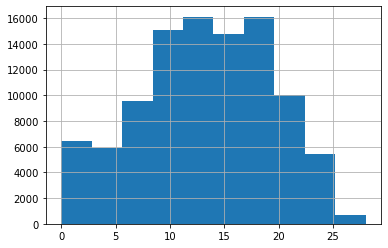

In [339]:
df['NumofDelayedPayment'].hist();

In [340]:
df['NumofDelayedPayment'].isna().sum()

0

# NumCreditInquiries

In [341]:
df['NumCreditInquiries'].value_counts()

4.0       11271
3.0        8890
6.0        8111
7.0        8058
2.0        8028
8.0        7866
1.0        7588
0.0        6972
5.0        5693
9.0        5283
11.0       5051
10.0       4936
12.0       4571
13.0       1480
14.0       1039
15.0        808
16.0        456
17.0        284
53.0          4
31.0          4
1114.0        4
1786.0        4
318.0         4
1622.0        4
1230.0        4
1768.0        4
1460.0        4
2297.0        4
2310.0        4
1244.0        4
285.0         4
757.0         3
1175.0        3
2362.0        3
692.0         3
1387.0        3
1890.0        3
2081.0        3
2241.0        3
1497.0        3
2190.0        3
1203.0        3
2022.0        3
1029.0        3
2141.0        3
473.0         3
2199.0        3
199.0         3
1599.0        3
528.0         3
710.0         3
1132.0        3
1908.0        3
163.0         3
605.0         3
1776.0        3
1157.0        3
2568.0        3
728.0         3
1787.0        3
1133.0        3
1179.0        3
514.0   

In [342]:
# Get the count of each value
#value_counts = df['NumCreditInquiries'].value_counts()

# Select the values where the count is less than 3 (or 5 if you like)
#to_remove = value_counts[value_counts <= 200].index

# Keep rows where the city column is not in to_remove
#df = df[~df.NumCreditInquiries.isin(to_remove)]

df.loc[(df.NumCreditInquiries >= 18 ), 'NumCreditInquiries'] = 0

In [343]:
df['NumCreditInquiries'].isna().sum()

1965

In [344]:
df['NumCreditInquiries'].mean()

5.6838170041311775

In [345]:
df['NumCreditInquiries'].fillna(value=df['NumCreditInquiries'].mean(), inplace=True)

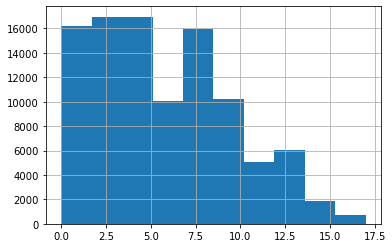

In [346]:
df['NumCreditInquiries'].hist();

# CreditMix

In [347]:
df['CreditMix'].value_counts()

Standard    36479
Good        24337
Bad         18989
Name: CreditMix, dtype: int64

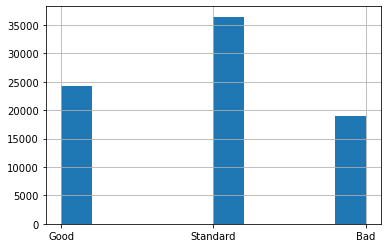

In [348]:
df['CreditMix'].hist();

In [349]:
df['CreditMix'].isna().sum()

20195

In [350]:
valueCreditMix='NoCreditMix'
df['CreditMix'].fillna(value=valueCreditMix, inplace=True)

# Amountinvestedmonthly: remove it, no sense

In [351]:
df['Amountinvestedmonthly'].value_counts()

10000.000000    4305
0.000000         169
80.415295          1
36.662351          1
89.738489          1
59.937258          1
165.180659         1
62.030803          1
215.577059         1
44.611359          1
195.593832         1
131.028160         1
189.419067         1
90.654286          1
219.026815         1
260.110033         1
351.726436         1
75.758867          1
81.773408          1
189.978959         1
318.111557         1
65.786080          1
281.423001         1
27.151630          1
117.011093         1
102.770922         1
56.844695          1
274.902959         1
250.369280         1
210.403770         1
144.414029         1
49.737833          1
14.954207          1
121.048884         1
73.611396          1
34.009466          1
59.261709          1
72.564027          1
162.192799         1
110.634894         1
524.143716         1
565.405080         1
343.749724         1
554.973098         1
221.064915         1
56.216702          1
224.439781         1
115.206779   

# PaymentBehaviour

In [356]:
df['PaymentBehaviour'].value_counts()

LowspentSmallvaluepayments      25513
HighspentMediumvaluepayments    17540
LowspentMediumvaluepayments     13861
HighspentLargevaluepayments     13721
HighspentSmallvaluepayments     11340
LowspentLargevaluepayments      10425
NoPaymentBehaviour               7600
Name: PaymentBehaviour, dtype: int64

In [353]:
df['PaymentBehaviour'].isna().sum()

7600

In [354]:
valuePaymentBehaviour='NoPaymentBehaviour'
df['PaymentBehaviour'].fillna(value=valuePaymentBehaviour, inplace=True)

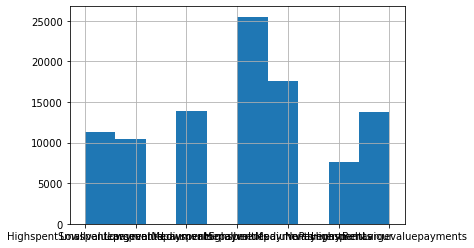

In [355]:
df['PaymentBehaviour'].hist();

# MonthlyBalance

In [357]:
df['MonthlyBalance'].value_counts()

-3.330000e+26    9
 3.500149e+02    2
 6.950572e+02    2
 3.124941e+02    1
 6.043402e+02    1
 2.549709e+02    1
 2.500932e+02    1
 2.897551e+02    1
 2.606258e+02    1
 6.068304e+02    1
 1.119905e+02    1
 2.995454e+02    1
 5.595406e+02    1
 5.896993e+02    1
 3.474139e+02    1
 2.548709e+02    1
 4.860169e+02    1
 2.818843e+02    1
 2.998726e+02    1
 3.189338e+02    1
 3.199757e+02    1
 3.428948e+02    1
 3.355687e+02    1
 3.053245e+02    1
 2.520849e+02    1
 2.780964e+02    1
 4.153253e+02    1
 6.711342e+02    1
 5.627838e+02    1
 5.203974e+02    1
 4.417318e+02    1
 4.792387e+02    1
 6.698565e+02    1
 2.696689e+02    1
 5.133383e+02    1
 6.862344e+02    1
 6.999123e+02    1
 7.206572e+02    1
 2.626588e+02    1
 5.776878e+02    1
 5.052021e+02    1
 2.362228e+02    1
 3.664007e+02    1
 5.102212e+02    1
 5.047971e+02    1
 2.653633e+02    1
 3.259500e+02    1
 3.061529e+02    1
 3.435103e+02    1
 3.704370e+02    1
 4.305140e+02    1
 4.257125e+02    1
 3.478731e+0

In [358]:
df['MonthlyBalance'].isna().sum()

1200

In [359]:
df['MonthlyBalance'].fillna(value=df['MonthlyBalance'].mean(), inplace=True)

# CreditHistoryYears 

In [360]:
df['CreditHistoryYears'].value_counts()

19.0    4784
18.0    4747
17.0    4718
16.0    4526
15.0    3854
20.0    3325
6.0     3054
13.0    3048
30.0    2982
32.0    2899
8.0     2814
29.0    2812
9.0     2803
31.0    2799
12.0    2790
23.0    2789
28.0    2767
24.0    2764
26.0    2727
22.0    2721
21.0    2708
11.0    2703
27.0    2622
10.0    2618
7.0     2575
25.0    2522
14.0    2360
5.0     2033
33.0    1106
1.0     1001
2.0      938
3.0      809
4.0      762
0.0      490
Name: CreditHistoryYears, dtype: int64

In [361]:
df['CreditHistoryYears'].isna().sum()

9030

In [362]:
df['CreditHistoryYears'].mean()

17.966516433989227

In [363]:
df['CreditHistoryYears'].fillna(value=df['CreditHistoryYears'].mean(), inplace=True)

# InterestRate

In [369]:
df['InterestRate'].value_counts()

8     5012
5     4979
6     4721
12    4540
10    4540
9     4494
7     4494
11    4428
18    4102
15    3992
20    3929
17    3813
16    3730
19    3630
3     2765
1     2683
4     2589
2     2465
13    2385
14    2229
0     2033
32    1742
22    1720
30    1690
24    1685
23    1683
29    1662
28    1616
27    1608
25    1566
21    1560
34    1502
26    1489
33    1467
31    1457
Name: InterestRate, dtype: int64

In [365]:
df['InterestRate'].isna().sum()

0

In [366]:
df.loc[(df.InterestRate >= 45 ), 'InterestRate'] = 0

In [367]:
df['InterestRate'].mean()

14.23616

In [368]:
df['InterestRate'].fillna(value=df['InterestRate'].mean(), inplace=True)

In [191]:
#сортировка
#df.sort_values('MonthlyBalance', ascending = False)

In [370]:
df.head()

,ID,CustomerID,Month,Name,Age,SSN,Occupation,AnnualIncome,MonthlyInhandSalary,NumBankAccounts,...,CreditMix,OutstandingDebt,CreditUtilizationRatio,PaymentofMinAmount,TotalEMIpermonth,Amountinvestedmonthly,PaymentBehaviour,MonthlyBalance,CreditScore,CreditHistoryYears
0,0x1602,CUS0xd40,January,Aaron Maashoh,23.000000,821-00-0265,Scientist,19114.12,1824.843333,3,...,NoCreditMix,809.98,26.822620,No,49.574949,80.415295,HighspentSmallvaluepayments,312.494089,Good,22.000000
1,0x1603,CUS0xd40,February,Aaron Maashoh,23.000000,821-00-0265,Scientist,19114.12,4194.170850,3,...,Good,809.98,31.944960,No,49.574949,118.280222,LowspentLargevaluepayments,284.629163,Good,17.966516
2,0x1604,CUS0xd40,March,Aaron Maashoh,33.307829,821-00-0265,Scientist,19114.12,4194.170850,3,...,Good,809.98,28.609352,No,49.574949,81.699521,LowspentMediumvaluepayments,331.209863,Good,22.000000
3,0x1605,CUS0xd40,April,Aaron Maashoh,23.000000,821-00-0265,Scientist,19114.12,4194.170850,3,...,Good,809.98,31.377862,No,49.574949,199.458074,LowspentSmallvaluepayments,223.451310,Good,22.000000
4,0x1606,CUS0xd40,May,Aaron Maashoh,23.000000,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,No,49.574949,41.420153,HighspentMediumvaluepayments,341.489231,Good,22.000000


In [371]:
df_new = df

In [380]:
df_new.head()

,Month,Age,Occupation,AnnualIncome,MonthlyInhandSalary,NumBankAccounts,NumCreditCard,InterestRate,NumofLoan,Delayfromduedate,...,NumCreditInquiries,CreditMix,OutstandingDebt,CreditUtilizationRatio,PaymentofMinAmount,TotalEMIpermonth,PaymentBehaviour,MonthlyBalance,CreditScore,CreditHistoryYears
0,January,23.000000,Scientist,19114.12,1824.843333,3,4,3,4.0,3,...,4.0,NoCreditMix,809.98,26.822620,No,49.574949,HighspentSmallvaluepayments,312.494089,Good,22.000000
1,February,23.000000,Scientist,19114.12,4194.170850,3,4,3,4.0,-1,...,4.0,Good,809.98,31.944960,No,49.574949,LowspentLargevaluepayments,284.629163,Good,17.966516
2,March,33.307829,Scientist,19114.12,4194.170850,3,4,3,4.0,3,...,4.0,Good,809.98,28.609352,No,49.574949,LowspentMediumvaluepayments,331.209863,Good,22.000000
3,April,23.000000,Scientist,19114.12,4194.170850,3,4,3,4.0,5,...,4.0,Good,809.98,31.377862,No,49.574949,LowspentSmallvaluepayments,223.451310,Good,22.000000
4,May,23.000000,Scientist,19114.12,1824.843333,3,4,3,4.0,6,...,4.0,Good,809.98,24.797347,No,49.574949,HighspentMediumvaluepayments,341.489231,Good,22.000000


# Statistical indicators

In [123]:
# a)  размах вариации
# range of variation
# формула: R = Xmax - Xmin

Xmax = df_new['AnnualIncome'].max()
Xmin = df_new['AnnualIncome'].min()
print("Max value is:", Xmax,'\n' "Min value is:",Xmin)
R = Xmax - Xmin
print("range of variation =",R)

Max value is: 24198062.0 
Min value is: 7005.93
range of variation = 24191056.07


In [124]:
# b) среднее по выборке
# sample mean
average  = df_new['AnnualIncome'].mean()
average
print("sample mean",average)

sample mean 176415.70129814756


In [96]:
#   c)медиану
# median
median = df_new['AnnualIncome'].median()
print("median = ",median)

median =  37578.61


In [125]:
#d)standartDeviation
standartDeviation=df_new['AnnualIncome'].std()
print('standartDeviation = ',standartDeviation)

standartDeviation =  1429618.0514141466


In [126]:
#e) example of sample mean of AnnualIncome for occupation Lawyer
average2 = df_new[(df_new['Occupation'] == 'Lawyer')]['AnnualIncome'].mean()
average2
print("sample mean  = ",average2)

sample mean  =  196039.87445779447


In [127]:
df_new['Age'].median()

33.0

In [128]:
df_new['Age'].std()

10.619104632825689

In [129]:
# skew  ассиметрия
df_new['Age'].skew()

0.16115720758266427

In [130]:
# Коэффициент эксцесса в теории вероятностей — мера остроты пика распределения случайной величины.
# Kurtosis is a measure of the combined weight of a distribution's tails relative to the center of the distribution;
df_new['Age'].kurt()

-0.8679626884415876

# new datset

In [373]:
df_new = df.drop(['CustomerID','ID','Name','TypeofLoan','SSN','ChangedCreditLimit','Amountinvestedmonthly'], axis = 1)

In [376]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100000 entries, 0 to 99999
Data columns (total 21 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Month                   100000 non-null  object 
 1   Age                     100000 non-null  float64
 2   Occupation              100000 non-null  object 
 3   AnnualIncome            100000 non-null  float64
 4   MonthlyInhandSalary     100000 non-null  float64
 5   NumBankAccounts         100000 non-null  int64  
 6   NumCreditCard           100000 non-null  int64  
 7   InterestRate            100000 non-null  int64  
 8   NumofLoan               100000 non-null  float64
 9   Delayfromduedate        100000 non-null  int64  
 10  NumofDelayedPayment     100000 non-null  float64
 11  NumCreditInquiries      100000 non-null  float64
 12  CreditMix               100000 non-null  object 
 13  OutstandingDebt         100000 non-null  float64
 14  CreditUtilizationRati

In [375]:
#df_new= df_new.dropna()

In [377]:
# determining the name of the file
file_name = 'NewDataFrame.csv'

In [378]:
# saving the excel
df_new.to_csv(file_name)
print('DataFrame is written to Excel File successfully.')

DataFrame is written to Excel File successfully.


# Визуализация
#1. признаки по одному

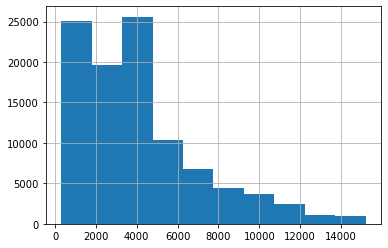

In [131]:
df_new['MonthlyInhandSalary'].hist();

array([[<AxesSubplot:title={'center':'Age'}>,
        <AxesSubplot:title={'center':'AnnualIncome'}>,
        <AxesSubplot:title={'center':'MonthlyInhandSalary'}>,
        <AxesSubplot:title={'center':'NumBankAccounts'}>],
       [<AxesSubplot:title={'center':'NumCreditCard'}>,
        <AxesSubplot:title={'center':'InterestRate'}>,
        <AxesSubplot:title={'center':'NumofLoan'}>,
        <AxesSubplot:title={'center':'Delayfromduedate'}>],
       [<AxesSubplot:title={'center':'NumofDelayedPayment'}>,
        <AxesSubplot:title={'center':'ChangedCreditLimit'}>,
        <AxesSubplot:title={'center':'NumCreditInquiries'}>,
        <AxesSubplot:title={'center':'OutstandingDebt'}>],
       [<AxesSubplot:title={'center':'CreditUtilizationRatio'}>,
        <AxesSubplot:title={'center':'TotalEMIpermonth'}>,
        <AxesSubplot:title={'center':'Amountinvestedmonthly'}>,
        <AxesSubplot:title={'center':'MonthlyBalance'}>],
       [<AxesSubplot:title={'center':'CreditHistoryYears'}>,
     

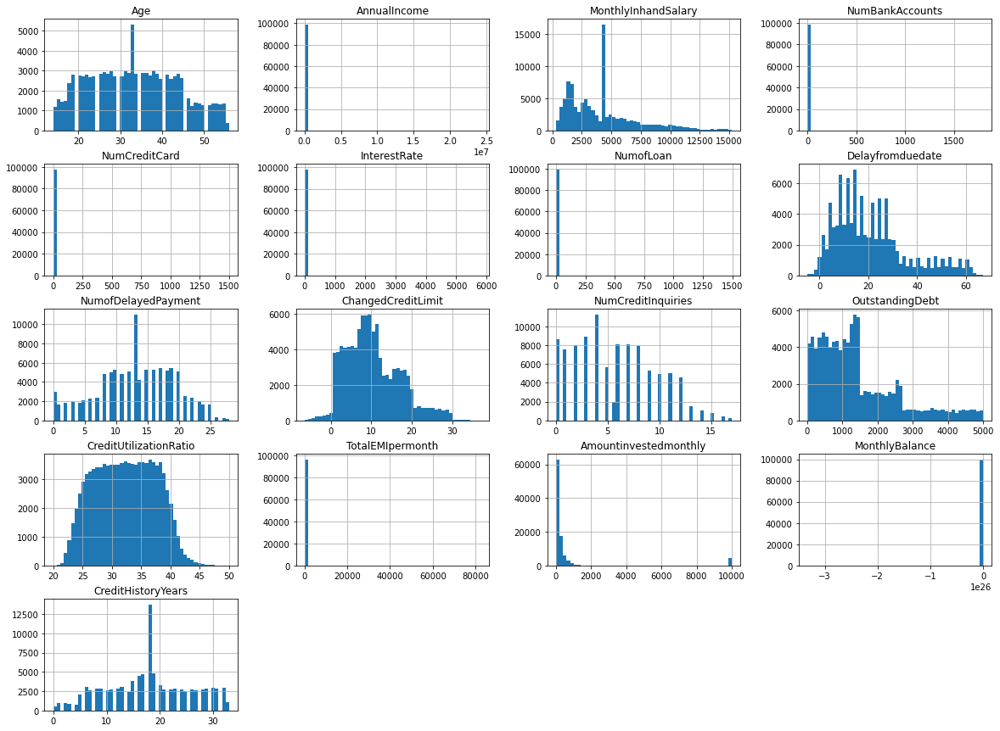

In [132]:
df_new.hist(bins = 50, figsize = (20,15))

In [197]:
df_new['PaymentBehaviour'].value_counts()

LowspentSmallvaluepayments      25513
HighspentMediumvaluepayments    17540
LowspentMediumvaluepayments     13861
HighspentLargevaluepayments     13721
HighspentSmallvaluepayments     11340
LowspentLargevaluepayments      10425
NoPaymentBehaviour               7600
Name: PaymentBehaviour, dtype: int64

In [105]:
df.CreditHistoryYears.describe()

count    100000.000000
mean         16.344140
std           9.459708
min           0.000000
25%           9.000000
50%          17.000000
75%          24.000000
max          33.000000
Name: CreditHistoryYears, dtype: float64

In [106]:
df['CreditHistoryYears_Range'] = pd.cut(df.CreditHistoryYears , bins = [-1, 9, 17, 24, 33], labels = ['min', 'mid_min', 'mid_max', 'max'], 
                          include_lowest=False)

<AxesSubplot:xlabel='CreditHistoryYears_Range', ylabel='count'>

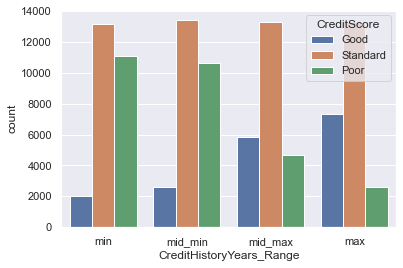

In [107]:
sns.countplot(x = 'CreditHistoryYears_Range', hue = 'CreditScore', data = df)

In [108]:
df.MonthlyBalance.describe()

count    1.000000e+05
mean    -2.997000e+22
std      3.158989e+24
min     -3.330000e+26
25%      2.678714e+02
50%      3.348066e+02
75%      4.676706e+02
max      1.602041e+03
Name: MonthlyBalance, dtype: float64

In [109]:
df['MonthlyBalance_Range'] = pd.cut(df.MonthlyBalance , bins = [-3.330000e+26, 2.678714e+02, 3.348066e+02, 4.676706e+02, 1.602041e+03], labels = ['min', 'mid_min', 'mid_max', 'max'], 
                          include_lowest=False)

<AxesSubplot:xlabel='MonthlyBalance_Range', ylabel='count'>

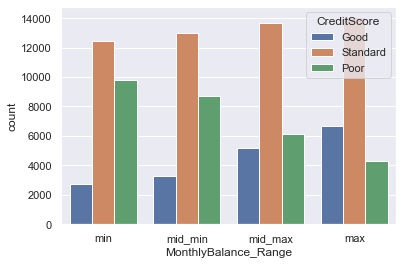

In [110]:
sns.countplot(x = 'MonthlyBalance_Range', hue = 'CreditScore', data = df)

<AxesSubplot:xlabel='Occupation', ylabel='count'>

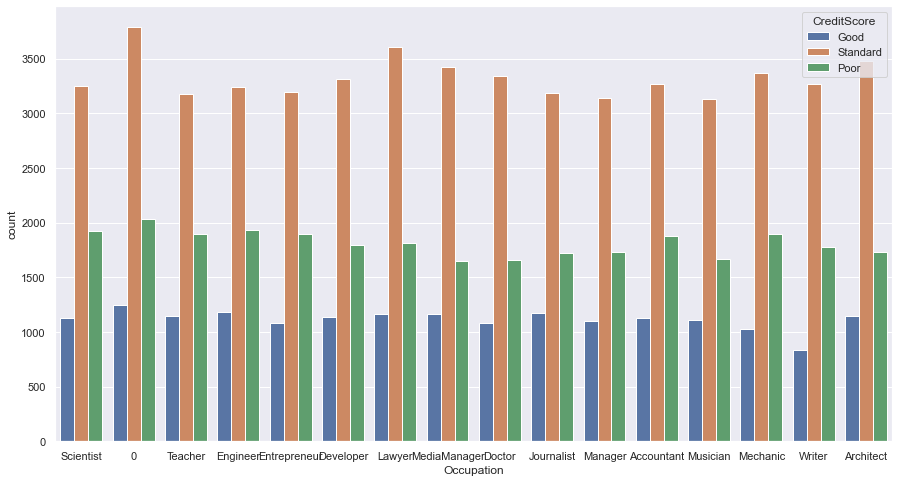

In [111]:
sns.set(rc = {'figure.figsize':(15,8)})
sns.countplot(x = 'Occupation', hue = 'CreditScore', data = df)


In [112]:
corr_M = df.corr()
corr_M

,Age,AnnualIncome,MonthlyInhandSalary,NumBankAccounts,NumCreditCard,InterestRate,NumofLoan,Delayfromduedate,NumofDelayedPayment,ChangedCreditLimit,NumCreditInquiries,OutstandingDebt,CreditUtilizationRatio,TotalEMIpermonth,Amountinvestedmonthly,MonthlyBalance,CreditHistoryYears
Age,1.000000,-0.000896,0.002664,0.001943,-0.001772,-0.005500,-0.001149,-0.009526,-0.001865,-0.002133,-0.002136,-0.002092,0.002886,0.000800,0.003412,0.001108,-0.000559
AnnualIncome,-0.000896,1.000000,0.025408,-0.004627,0.001250,-0.002903,0.001486,-0.010631,0.001045,0.000083,0.003159,-0.003706,0.010316,-0.000248,-0.005026,0.000818,-0.001909
MonthlyInhandSalary,0.002664,0.025408,1.000000,-0.010674,-0.005041,-0.004165,-0.005347,-0.202731,0.001439,-0.136940,-0.006778,-0.220670,0.143035,0.006158,0.049397,-0.001031,0.180914
NumBankAccounts,0.001943,-0.004627,-0.010674,1.000000,-0.002216,-0.003994,-0.000735,0.015966,-0.003518,0.007514,-0.001701,0.015548,-0.001365,-0.001433,0.003068,0.001058,-0.008035
NumCreditCard,-0.001772,0.001250,-0.005041,-0.002216,1.000000,-0.004007,0.001350,0.008715,0.004700,0.005915,-0.003528,0.005626,-0.003341,0.000768,-0.002163,0.001268,-0.002127
InterestRate,-0.005500,-0.002903,-0.004165,-0.003994,-0.004007,1.000000,0.000623,0.009805,0.002786,0.000276,-0.001663,0.010681,-0.000299,0.002524,-0.001044,0.001248,-0.007343
NumofLoan,-0.001149,0.001486,-0.005347,-0.000735,0.001350,0.000623,1.000000,0.012690,0.010202,0.014649,-0.000452,0.023929,-0.003949,0.001465,-0.001117,-0.000027,-0.020977
Delayfromduedate,-0.009526,-0.010631,-0.202731,0.015966,0.008715,0.009805,0.012690,1.000000,0.012159,0.284409,0.011415,0.571713,-0.063796,-0.003889,-0.012209,0.004442,-0.394198
NumofDelayedPayment,-0.001865,0.001045,0.001439,-0.003518,0.004700,0.002786,0.010202,0.012159,1.000000,0.006934,0.002505,0.009672,0.001109,0.001145,0.001384,0.000830,-0.007014
ChangedCreditLimit,-0.002133,0.000083,-0.136940,0.007514,0.005915,0.000276,0.014649,0.284409,0.006934,1.000000,0.006064,0.443653,-0.048217,-0.001103,-0.010735,-0.002401,-0.327302


<AxesSubplot:>

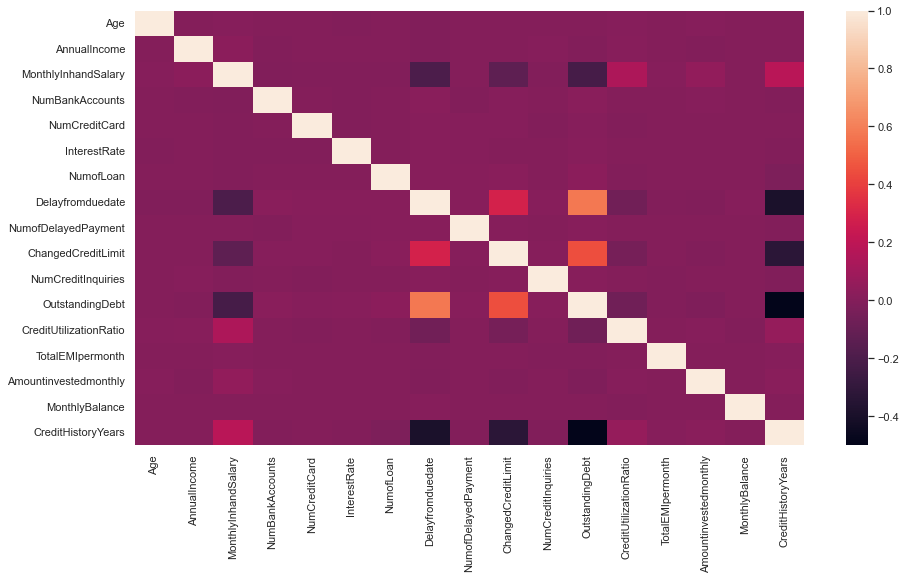

In [113]:
sns.heatmap(df.corr())

#Handling Nulls values

In [114]:
df['Month'].value_counts()

January     12500
February    12500
March       12500
April       12500
May         12500
June        12500
July        12500
August      12500
Name: Month, dtype: int64

In [115]:
df['CreditScore'].value_counts()

Standard    53174
Poor        28998
Good        17828
Name: CreditScore, dtype: int64

In [116]:
df['CreditMix'].value_counts()


Standard    36479
Good        24337
0           20195
Bad         18989
Name: CreditMix, dtype: int64

In [117]:
df['PaymentofMinAmount'].value_counts()

Yes    64333
No     35667
Name: PaymentofMinAmount, dtype: int64

In [15]:
#ТРАНФОРМЕР 
class some_transformer (BaseEstimator, TransformerMixin):
    
    def __init__(self, remove_origin = False):
        self.remove_origin = remove_origin
    
    def fit(self, X, y = None):
        return self
    
    def transform(self, X, y = None):
        # Transformation
        X.fillna(0,inplace = True)
        
        
# СЮДА МОЖНО ЗАСУНУТЬ ВСЕ ДАМНИС, ХОТТЕР И ТОГДА ПОЛУЧИТСЯ ВСЕ.

        if self.remove_origin:
            # Remove original fields
            pass
        
        return X

In [6]:
#после трансформатора создаем объект 
some_transformer = some_transformer()

In [7]:
df1 = some_transformer.transform(df)

In [8]:
class Months (BaseEstimator, TransformerMixin):
    
    def __init__(self, remove_origin = False):
        self.remove_origin = remove_origin
    
    def fit(self, X, y = None):
        return self
    
    def transform(self, X, y = None):
        # Transformation
        X.fillna(0,inplace = True)
        X['Month'] = X['Month'].map({'January':0, 'February':1, 'March':2,'April':3, 'May':4, 'June':5,'July':6, 'Augusth':7})
        
# СЮДА МОЖНО ЗАСУНУТЬ ВСЕ ДАМНИС, ХОТТЕР И ТОГДА ПОЛУЧИТСЯ ВСЕ.

        if self.remove_origin:
            pass
        
            # Remove original fields
           # X.drop(['Type of Travel'],axis = 1, inplace = True)
        
        return X

In [9]:
class CreditScore (BaseEstimator, TransformerMixin):
    
    def __init__(self, remove_origin = False):
        self.remove_origin = remove_origin
    
    def fit(self, X, y = None):
        return self
    
    def transform(self, X, y = None):
        # Transformation
        X.fillna(0,inplace = True)
        X['CreditScore'] = X['CreditScore'].map({'Standard':0, 'Poor':1, 'Good':2})
        
# СЮДА МОЖНО ЗАСУНУТЬ ВСЕ ДАМНИС, ХОТТЕР И ТОГДА ПОЛУЧИТСЯ ВСЕ.

        if self.remove_origin:
            pass
        
            # Remove original fields
           # X.drop(['Type of Travel'],axis = 1, inplace = True)
        
        return X

In [10]:
class CreditMix (BaseEstimator, TransformerMixin):
    
    def __init__(self, remove_origin = False):
        self.remove_origin = remove_origin
    
    def fit(self, X, y = None):
        return self
    
    def transform(self, X, y = None):
        # Transformation
        X.fillna(0,inplace = True)
        X['CreditMix'] = X['CreditMix'].map({'Standard':0, 'Good':1, 'Bad':2})
        
# СЮДА МОЖНО ЗАСУНУТЬ ВСЕ ДАМНИС, ХОТТЕР И ТОГДА ПОЛУЧИТСЯ ВСЕ.

        if self.remove_origin:
            pass
        
            # Remove original fields
           # X.drop(['Type of Travel'],axis = 1, inplace = True)
        
        return X

In [11]:
class PaymentofMinAmount (BaseEstimator, TransformerMixin):
    
    def __init__(self, remove_origin = False):
        self.remove_origin = remove_origin
    
    def fit(self, X, y = None):
        return self
    
    def transform(self, X, y = None):
        # Transformation
        X.fillna(0,inplace = True)
        X['PaymentofMinAmount'] = X['PaymentofMinAmount'].map({'Yes':0, 'No':1})
        
# СЮДА МОЖНО ЗАСУНУТЬ ВСЕ ДАМНИС, ХОТТЕР И ТОГДА ПОЛУЧИТСЯ ВСЕ.

        if self.remove_origin:
            pass
        
            # Remove original fields
           # X.drop(['Type of Travel'],axis = 1, inplace = True)
        
        return X

In [12]:
class Occupation (BaseEstimator, TransformerMixin):
    
    def __init__(self, remove_origin = False):
        self.remove_origin = remove_origin
    
    def fit(self, X, y = None):
        return self
    
    def transform(self, X, y = None):
        # Transformation
        X.fillna(0,inplace = True)
    
        X = pd.get_dummies(X,columns=['Occupation'])
        
# СЮДА МОЖНО ЗАСУНУТЬ ВСЕ ДАМНИС, ХОТТЕР И ТОГДА ПОЛУЧИТСЯ ВСЕ.

        if self.remove_origin:
            pass
        
            # Remove original fields
           # X.drop(['Type of Travel'],axis = 1, inplace = True)
        
        return X

In [18]:
class PaymentBehaviour (BaseEstimator, TransformerMixin):
    
    def __init__(self, remove_origin = False):
        self.remove_origin = remove_origin
    
    def fit(self, X, y = None):
        return self
    
    def transform(self, X, y = None):
        # Transformation
        X.fillna(0,inplace = True)
    
        oh = OneHotEncoder()
        h_cat_en, h_categories = X['PaymentBehaviour'].factorize()
        coded = oh.fit_transform(h_cat_en.reshape(-1,1))
        proxy = pd.DataFrame(coded.toarray(), index = X.index, columns = ['1','2','3','4','5','6','7'])
        X = pd.concat([X, proxy], axis = 1)
       # X = df.drop(['PaymentBehaviour','CustomerID','ID','Name','CreditScore','TypeofLoan','SSN','CreditHistoryYears_Range','MonthlyBalance_Range'], axis = 1)
       # X = pd.concat([X, proxy], axis = 1)
        
# СЮДА МОЖНО ЗАСУНУТЬ ВСЕ ДАМНИС, ХОТТЕР И ТОГДА ПОЛУЧИТСЯ ВСЕ.

        if self.remove_origin:
            pass
        
            # Remove original fields
           # X.drop(['Type of Travel'],axis = 1, inplace = True)
        
        return X

In [13]:
from sklearn.pipeline import Pipeline

In [20]:
myPipe = Pipeline ([('some_transformer',some_transformer()),
                    ('Months',Months()), 
                    ('CreditScore',CreditScore()), 
                    ('CreditMix',CreditMix()),
                    ('PaymentofMinAmount',PaymentofMinAmount()),
                    ('Occupation',Occupation()),
                    ('PaymentBehaviour',PaymentBehaviour())
                   
                   ])

In [21]:
myPipe.transform(df)

,ID,CustomerID,Month,Name,Age,SSN,AnnualIncome,MonthlyInhandSalary,NumBankAccounts,NumCreditCard,...,Occupation_Scientist,Occupation_Teacher,Occupation_Writer,1,2,3,4,5,6,7
0,0x1602,CUS0xd40,0.0,Aaron Maashoh,23.0,821-00-0265,19114.12,1824.843333,3,4,...,1,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0x1603,CUS0xd40,0.0,Aaron Maashoh,23.0,821-00-0265,19114.12,0.000000,3,4,...,1,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,0x1604,CUS0xd40,0.0,Aaron Maashoh,0.0,821-00-0265,19114.12,0.000000,3,4,...,1,0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,0x1605,CUS0xd40,0.0,Aaron Maashoh,23.0,821-00-0265,19114.12,0.000000,3,4,...,1,0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0x1606,CUS0xd40,0.0,Aaron Maashoh,23.0,821-00-0265,19114.12,1824.843333,3,4,...,1,0,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0x25fe9,CUS0x942c,0.0,Nicks,25.0,078-73-5990,39628.99,3359.415833,4,6,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
99996,0x25fea,CUS0x942c,0.0,Nicks,25.0,078-73-5990,39628.99,3359.415833,4,6,...,0,0,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
99997,0x25feb,CUS0x942c,0.0,Nicks,25.0,078-73-5990,39628.99,3359.415833,4,6,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
99998,0x25fec,CUS0x942c,0.0,Nicks,25.0,078-73-5990,39628.99,3359.415833,4,6,...,0,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [118]:
df['Month'] = df['Month'].map({'January':0, 'February':1, 'March':2,'April':3, 'May':4, 'June':5,'July':6, 'Augusth':7})

In [119]:
#df['PaymentBehaviour'] = df['PaymentBehaviour'].map({'LowspentSmallvaluepayments':0, 'HighspentMediumvaluepayments':1, 'LowspentMediumvaluepayments':2,'HighspentLargevaluepayments':3, 'HighspentSmallvaluepayments':4, 'LowspentLargevaluepayments ':5})

In [120]:
df['CreditScore'] = df['CreditScore'].map({'Standard':0, 'Poor':1, 'Good':2})

In [121]:
df['CreditMix'] = df['CreditMix'].map({'Standard':0, 'Good':1, 'Bad':2})

In [122]:
df['PaymentofMinAmount'] = df['PaymentofMinAmount'].map({'Yes':0, 'No':1})

In [123]:
df.head()


,ID,CustomerID,Month,Name,Age,SSN,Occupation,AnnualIncome,MonthlyInhandSalary,NumBankAccounts,...,CreditUtilizationRatio,PaymentofMinAmount,TotalEMIpermonth,Amountinvestedmonthly,PaymentBehaviour,MonthlyBalance,CreditScore,CreditHistoryYears,CreditHistoryYears_Range,MonthlyBalance_Range
0,0x1602,CUS0xd40,0.0,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3,...,26.822620,1,49.574949,80.415295,HighspentSmallvaluepayments,312.494089,2,22.0,mid_max,mid_min
1,0x1603,CUS0xd40,1.0,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,0.000000,3,...,31.944960,1,49.574949,118.280222,LowspentLargevaluepayments,284.629163,2,0.0,min,mid_min
2,0x1604,CUS0xd40,2.0,Aaron Maashoh,0.0,821-00-0265,Scientist,19114.12,0.000000,3,...,28.609352,1,49.574949,81.699521,LowspentMediumvaluepayments,331.209863,2,22.0,mid_max,mid_min
3,0x1605,CUS0xd40,3.0,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,0.000000,3,...,31.377862,1,49.574949,199.458074,LowspentSmallvaluepayments,223.451310,2,22.0,mid_max,min
4,0x1606,CUS0xd40,4.0,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3,...,24.797347,1,49.574949,41.420153,HighspentMediumvaluepayments,341.489231,2,22.0,mid_max,mid_max


In [124]:
#it = df.groupby(['CreditScore'])[['NumofLoan','Age']].agg([np.std,np.min,np.max])
#it

NumofLoan                        Age             
                   std   amin    amax         std amin    amax
CreditScore                                                   
0            63.572078 -100.0  1496.0  679.809653  0.0  8698.0
1            59.428396 -100.0  1485.0  682.099219  0.0  8697.0
2            64.754130 -100.0  1459.0  698.811393  0.0  8655.0

In [43]:
#we can go through average value and save it to excel
NumofLoans = df.groupby('CreditScore')['NumofLoan'].mean()
AnnualIncome = df.groupby('CreditScore')['AnnualIncome'].mean()
AnnualIncome.to_csv('AnnualIncome.csv')
NumofLoans.to_csv('NumofLoans.csv')

In [44]:
AnnualIncome = pd.read_csv('AnnualIncome.csv')
NumofLoans = pd.read_csv('NumofLoans.csv')

In [45]:
NumofLoans

,CreditScore,NumofLoan
0,0,2.982529
1,1,3.894889
2,2,1.848721


In [46]:
AnnualIncome

,CreditScore,AnnualIncome
0,0,185249.156458
1,1,154979.031698
2,2,184936.589810


In [47]:
pd.concat([AnnualIncome,NumofLoans], axis = 0)

,CreditScore,AnnualIncome,NumofLoan
0,0,185249.156458,NaN
1,1,154979.031698,NaN
2,2,184936.589810,NaN
0,0,NaN,2.982529
1,1,NaN,3.894889
2,2,NaN,1.848721


In [48]:
#our CrossTable:(we can see how credit score estimates according to annualIncome and occupation of people)
#pd.crosstab([df.CreditScore], df.Occupation, values = df.AnnualIncome, aggfunc = [np.sum])

sum                                            \
Occupation              0    Accountant     Architect     Developer   
CreditScore                                                           
0            6.102205e+08  7.675722e+08  5.870624e+08  5.044027e+08   
1            3.800856e+08  3.412786e+08  2.666538e+08  3.240557e+08   
2            2.524413e+08  1.363875e+08  2.140226e+08  2.233524e+08   

                                                                     \
Occupation         Doctor      Engineer  Entrepreneur    Journalist   
CreditScore                                                           
0            8.026657e+08  5.308767e+08  6.518218e+08  5.793642e+08   
1            1.784188e+08  2.868445e+08  2.514133e+08  1.906541e+08   
2            1.871652e+08  2.864222e+08  2.293916e+08  1.889488e+08   

                                                                     \
Occupation         Lawyer       Manager      Mechanic  MediaManager   
CreditScore                                                           
0            7.093799e+08  4.690010e+08  6.367604e+08  7.775625e+08   
1            3.707894e+08  3.541694e+08  1.981707e+08  2.281506e+08   
2            2.087928e+08  1.278129e+08  2.526769e+08  1.746055e+08   

                                                                     
Occupation       Musician     Scientist       Teacher        Writer  
CreditScore                                                          
0            5.887608e+08  4.830778e+08  5.812762e+08  5.706339e+08  
1            2.838337e+08  3.026418e+08  3.165611e+08  2.203608e+08  
2            2.471921e+08  3.162252e+08  1.157026e+08  1.359098e+08

In [125]:
df = pd.get_dummies(df,columns=['Occupation'])

In [126]:
df.head()

,ID,CustomerID,Month,Name,Age,SSN,AnnualIncome,MonthlyInhandSalary,NumBankAccounts,NumCreditCard,...,Occupation_Entrepreneur,Occupation_Journalist,Occupation_Lawyer,Occupation_Manager,Occupation_Mechanic,Occupation_MediaManager,Occupation_Musician,Occupation_Scientist,Occupation_Teacher,Occupation_Writer
0,0x1602,CUS0xd40,0.0,Aaron Maashoh,23.0,821-00-0265,19114.12,1824.843333,3,4,...,0,0,0,0,0,0,0,1,0,0
1,0x1603,CUS0xd40,1.0,Aaron Maashoh,23.0,821-00-0265,19114.12,0.000000,3,4,...,0,0,0,0,0,0,0,1,0,0
2,0x1604,CUS0xd40,2.0,Aaron Maashoh,0.0,821-00-0265,19114.12,0.000000,3,4,...,0,0,0,0,0,0,0,1,0,0
3,0x1605,CUS0xd40,3.0,Aaron Maashoh,23.0,821-00-0265,19114.12,0.000000,3,4,...,0,0,0,0,0,0,0,1,0,0
4,0x1606,CUS0xd40,4.0,Aaron Maashoh,23.0,821-00-0265,19114.12,1824.843333,3,4,...,0,0,0,0,0,0,0,1,0,0


In [127]:
df=df.dropna(axis=0)

# Отделение меток

In [128]:
df=df.dropna(axis=0)

In [129]:
X

,Month,Age,AnnualIncome,MonthlyInhandSalary,NumBankAccounts,NumCreditCard,InterestRate,NumofLoan,Delayfromduedate,NumofDelayedPayment,...,Occupation_Scientist,Occupation_Teacher,Occupation_Writer,1,2,3,4,5,6,7
1,1.0,23.0,19114.12,0.000000,3,4,3,4.0,-1,0.0,...,1,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2.0,0.0,19114.12,0.000000,3,4,3,4.0,3,7.0,...,1,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,3.0,23.0,19114.12,0.000000,3,4,3,4.0,5,4.0,...,1,0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,4.0,23.0,19114.12,1824.843333,3,4,3,4.0,6,0.0,...,1,0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
5,5.0,23.0,19114.12,0.000000,3,4,3,4.0,8,4.0,...,1,0,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99989,5.0,28.0,20002.88,1929.906667,10,8,29,5.0,33,25.0,...,0,0,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
99990,6.0,28.0,20002.88,1929.906667,10,8,29,5.0,33,26.0,...,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
99993,1.0,25.0,39628.99,3359.415833,4,6,7,2.0,23,0.0,...,0,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
99997,5.0,25.0,39628.99,3359.415833,4,6,5729,2.0,27,6.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [130]:
X = df.drop(['CustomerID','ID','Name','CreditScore','TypeofLoan','SSN'], axis = 1)

# Обработка категориальных признаков с помощью OneHotEncoder

In [131]:
h_cat_en, h_categories = X['PaymentBehaviour'].factorize()

In [132]:
h_cat_en

array([0, 1, 2, ..., 1, 5, 0], dtype=int64)

In [133]:
h_categories

Index([  'LowspentLargevaluepayments',  'LowspentMediumvaluepayments',
         'LowspentSmallvaluepayments', 'HighspentMediumvaluepayments',
                                    0,  'HighspentLargevaluepayments',
        'HighspentSmallvaluepayments'],
      dtype='object')

In [134]:
from sklearn.preprocessing import OneHotEncoder

In [135]:
oh = OneHotEncoder()

In [136]:
coded = oh.fit_transform(h_cat_en.reshape(-1,1))

In [137]:
coded

<69909x7 sparse matrix of type '<class 'numpy.float64'>'
	with 69909 stored elements in Compressed Sparse Row format>

In [138]:
proxy = pd.DataFrame(coded.toarray(), index = X.index, columns = ['1','2','3','4','5','6','7'])

In [139]:
X = pd.concat([X, proxy], axis = 1)

In [145]:
X = df.drop(['PaymentBehaviour','CustomerID','ID','Name','CreditScore','TypeofLoan','SSN','CreditHistoryYears_Range','MonthlyBalance_Range'], axis = 1)

In [146]:
X = pd.concat([X, proxy], axis = 1)

In [147]:
Y = df['CreditScore']

In [148]:
X

,Month,Age,AnnualIncome,MonthlyInhandSalary,NumBankAccounts,NumCreditCard,InterestRate,NumofLoan,Delayfromduedate,NumofDelayedPayment,...,Occupation_Scientist,Occupation_Teacher,Occupation_Writer,1,2,3,4,5,6,7
1,1.0,23.0,19114.12,0.000000,3,4,3,4.0,-1,0.0,...,1,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2.0,0.0,19114.12,0.000000,3,4,3,4.0,3,7.0,...,1,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,3.0,23.0,19114.12,0.000000,3,4,3,4.0,5,4.0,...,1,0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,4.0,23.0,19114.12,1824.843333,3,4,3,4.0,6,0.0,...,1,0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
5,5.0,23.0,19114.12,0.000000,3,4,3,4.0,8,4.0,...,1,0,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99989,5.0,28.0,20002.88,1929.906667,10,8,29,5.0,33,25.0,...,0,0,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
99990,6.0,28.0,20002.88,1929.906667,10,8,29,5.0,33,26.0,...,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
99993,1.0,25.0,39628.99,3359.415833,4,6,7,2.0,23,0.0,...,0,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
99997,5.0,25.0,39628.99,3359.415833,4,6,5729,2.0,27,6.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
